In [1]:
from torchvision import models
import torch
from torch import nn
from torch.utils.data import DataLoader

In [2]:
dir(models)

['AlexNet',
 'AlexNet_Weights',
 'ConvNeXt',
 'ConvNeXt_Base_Weights',
 'ConvNeXt_Large_Weights',
 'ConvNeXt_Small_Weights',
 'ConvNeXt_Tiny_Weights',
 'DenseNet',
 'DenseNet121_Weights',
 'DenseNet161_Weights',
 'DenseNet169_Weights',
 'DenseNet201_Weights',
 'EfficientNet',
 'EfficientNet_B0_Weights',
 'EfficientNet_B1_Weights',
 'EfficientNet_B2_Weights',
 'EfficientNet_B3_Weights',
 'EfficientNet_B4_Weights',
 'EfficientNet_B5_Weights',
 'EfficientNet_B6_Weights',
 'EfficientNet_B7_Weights',
 'EfficientNet_V2_L_Weights',
 'EfficientNet_V2_M_Weights',
 'EfficientNet_V2_S_Weights',
 'GoogLeNet',
 'GoogLeNetOutputs',
 'GoogLeNet_Weights',
 'Inception3',
 'InceptionOutputs',
 'Inception_V3_Weights',
 'MNASNet',
 'MNASNet0_5_Weights',
 'MNASNet0_75_Weights',
 'MNASNet1_0_Weights',
 'MNASNet1_3_Weights',
 'MaxVit',
 'MaxVit_T_Weights',
 'MobileNetV2',
 'MobileNetV3',
 'MobileNet_V2_Weights',
 'MobileNet_V3_Large_Weights',
 'MobileNet_V3_Small_Weights',
 'RegNet',
 'RegNet_X_16GF_Weights'

In [2]:
alexnet = models.alexnet(pretrained=True)

c:\Users\aramp\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\aramp\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [5]:
print(alexnet)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [10]:
with open("alexnetlabels.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]

In [4]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cpu device


## Initial look at how the pictures look

In [11]:
import matplotlib.pyplot as plt
from torchvision.io import read_image
img=read_image("mychair.jpg")
print(f"{type(img) = }, {img.dtype = }, {img.shape = }")

type(img) = <class 'torch.Tensor'>, img.dtype = torch.uint8, img.shape = torch.Size([3, 1512, 2016])


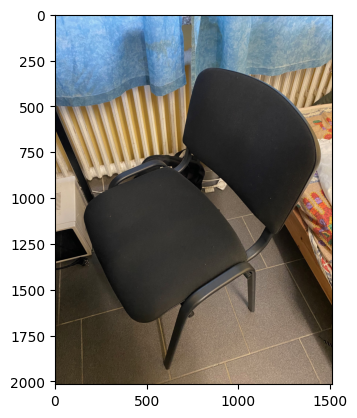

In [15]:
plt.imshow(img.permute(2, 1, 0))

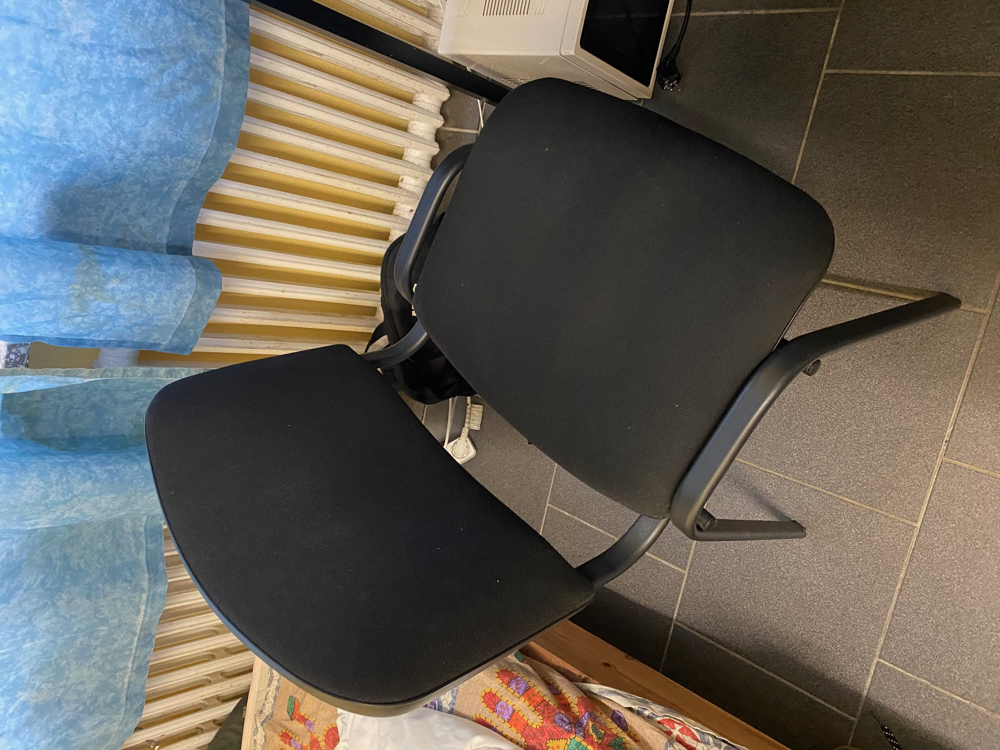

In [18]:
from PIL import Image
img = Image.open("mychair.jpg")
img

In [3]:
from torchvision import transforms
transform = transforms.Compose([            #[1]
 transforms.Resize(256),                    #[2]
 transforms.CenterCrop(224),                #[3]
 transforms.ToTensor(),                     #[4]
 transforms.Normalize(                      #[5]
 mean=[0.485, 0.456, 0.406],                #[6]
 std=[0.229, 0.224, 0.225]                  #[7]
 )])

In [19]:
img_t = transform(img)
batch_t = torch.unsqueeze(img_t, 0)


In [20]:
alexnet.eval()
out = alexnet(batch_t)
print(out.shape)

torch.Size([1, 1000])


In [28]:
probabilities = torch.nn.functional.softmax(out[0], dim=0)
# Show top categories per image
top5_prob, top5_catid = torch.topk(probabilities, 5)
for i in range(top5_prob.size(0)):
    print(categories[top5_catid[i]], top5_prob[i].item())

backpack 0.11550918966531754
clog 0.07152699679136276
grand piano 0.04169966280460358
cuirass 0.037903595715761185
wok 0.031885430216789246


In [24]:
percentage

tensor([2.6246e-04, 2.8405e-04, 1.0834e-03, 2.8597e-04, 2.9432e-03, 2.8458e-03,
        9.4836e-04, 2.3605e-03, 4.7170e-04, 2.7180e-05, 1.9131e-03, 7.5980e-04,
        4.3185e-03, 8.9815e-03, 6.1452e-05, 3.0859e-02, 1.0697e-02, 6.2445e-03,
        6.7857e-02, 2.0092e-02, 2.4134e-04, 6.9925e-03, 4.7928e-04, 7.0736e-03,
        1.4272e-05, 2.4028e-05, 1.0006e-05, 1.1003e-05, 2.0122e-04, 1.0686e-03,
        7.6340e-06, 1.1186e-06, 4.3127e-06, 7.8606e-04, 8.5960e-04, 3.4037e-05,
        8.0965e-04, 1.7918e-04, 3.4075e-04, 2.1731e-04, 2.1835e-04, 7.7068e-05,
        9.9259e-05, 3.2355e-04, 7.7584e-04, 2.8904e-04, 3.9119e-04, 1.1791e-04,
        6.8166e-06, 7.2345e-06, 2.1241e-04, 1.3665e-03, 4.7000e-04, 5.7288e-04,
        2.2250e-03, 8.7700e-06, 5.9178e-03, 1.6139e-04, 5.8084e-04, 5.0620e-04,
        2.2681e-03, 3.7635e-03, 1.4256e-04, 1.2995e-04, 2.5612e-04, 1.8844e-03,
        2.3350e-05, 8.5970e-05, 8.0312e-05, 6.8760e-04, 6.4216e-05, 2.7192e-04,
        3.0242e-04, 3.4970e-05, 2.6500e-

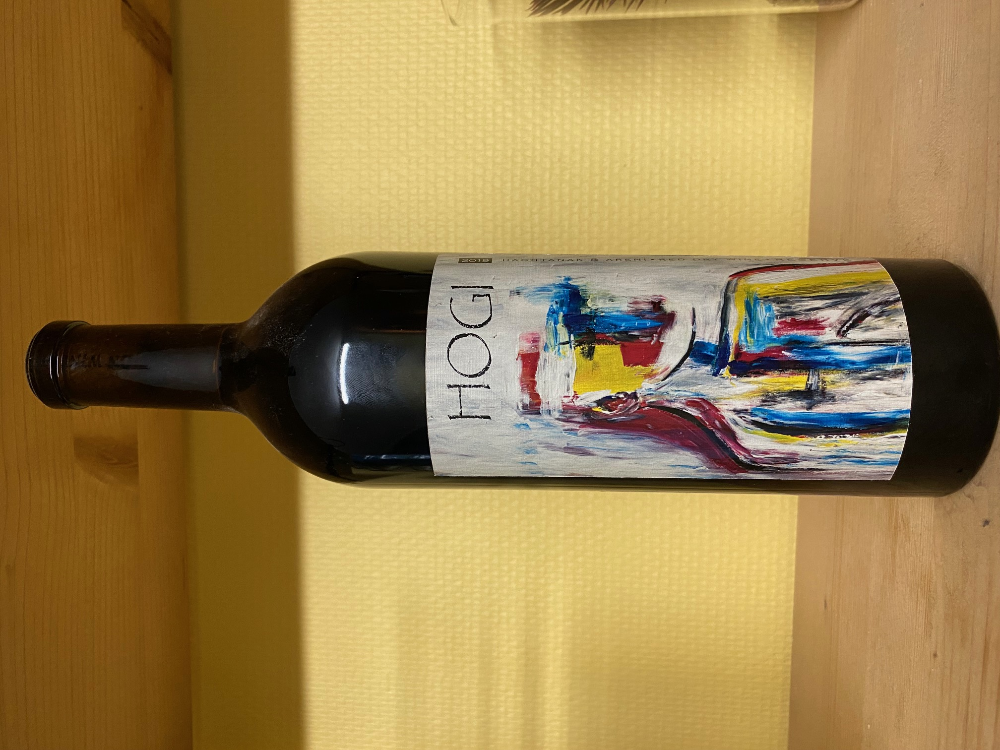

In [29]:
img = Image.open("Wine.jpg")
img

In [30]:
img_t = transform(img)
batch_t = torch.unsqueeze(img_t, 0)
out = alexnet(batch_t)
probabilities = torch.nn.functional.softmax(out[0], dim=0)
# Show top categories per image
top5_prob, top5_catid = torch.topk(probabilities, 5)
for i in range(top5_prob.size(0)):
    print(categories[top5_catid[i]], top5_prob[i].item())

medicine chest 0.26941123604774475
pencil box 0.06450428813695908
remote control 0.04482152312994003
microwave 0.03003048337996006
water bottle 0.02919260784983635


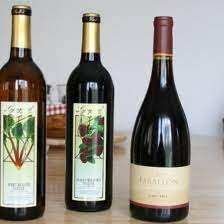

In [33]:
img = Image.open("download.jpg")
img

In [34]:
img_t = transform(img)
batch_t = torch.unsqueeze(img_t, 0)
out = alexnet(batch_t)
probabilities = torch.nn.functional.softmax(out[0], dim=0)
# Show top categories per image
top5_prob, top5_catid = torch.topk(probabilities, 5)
for i in range(top5_prob.size(0)):
    print(categories[top5_catid[i]], top5_prob[i].item())

wine bottle 0.7550227642059326
red wine 0.23209311068058014
beer bottle 0.01110931858420372
pop bottle 0.0009160277550108731
corkscrew 0.00024226943787653


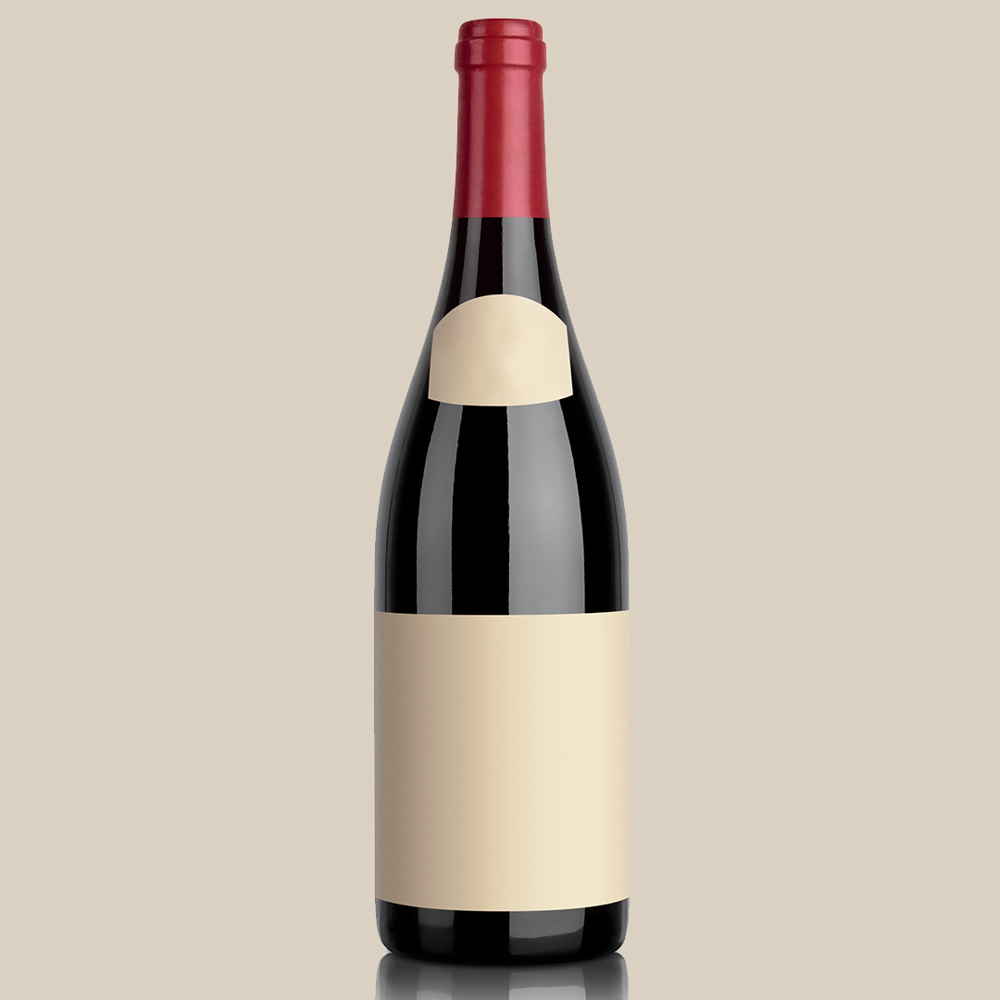

In [35]:
img = Image.open("burg-bottle.jpg")
img

In [36]:
img_t = transform(img)
batch_t = torch.unsqueeze(img_t, 0)
out = alexnet(batch_t)
probabilities = torch.nn.functional.softmax(out[0], dim=0)
# Show top categories per image
top5_prob, top5_catid = torch.topk(probabilities, 5)
for i in range(top5_prob.size(0)):
    print(categories[top5_catid[i]], top5_prob[i].item())

red wine 0.8111225962638855
wine bottle 0.1341458112001419
lipstick 0.02427259273827076
projectile 0.006995127536356449
cocktail shaker 0.002453839872032404


In [47]:
img = Image.open("Wine.jpg")
img=img.rotate(270,expand=True)

In [48]:
img_t = transform(img)
batch_t = torch.unsqueeze(img_t, 0)
out = alexnet(batch_t)
probabilities = torch.nn.functional.softmax(out[0], dim=0)
# Show top categories per image
top5_prob, top5_catid = torch.topk(probabilities, 5)
for i in range(top5_prob.size(0)):
    print(categories[top5_catid[i]], top5_prob[i].item())

beer bottle 0.3527335524559021
pop bottle 0.23920056223869324
hair spray 0.12253621965646744
lotion 0.1120191365480423
wine bottle 0.06442811340093613


## Time to Try Augmentation and Fine Tuning

### Augmentation

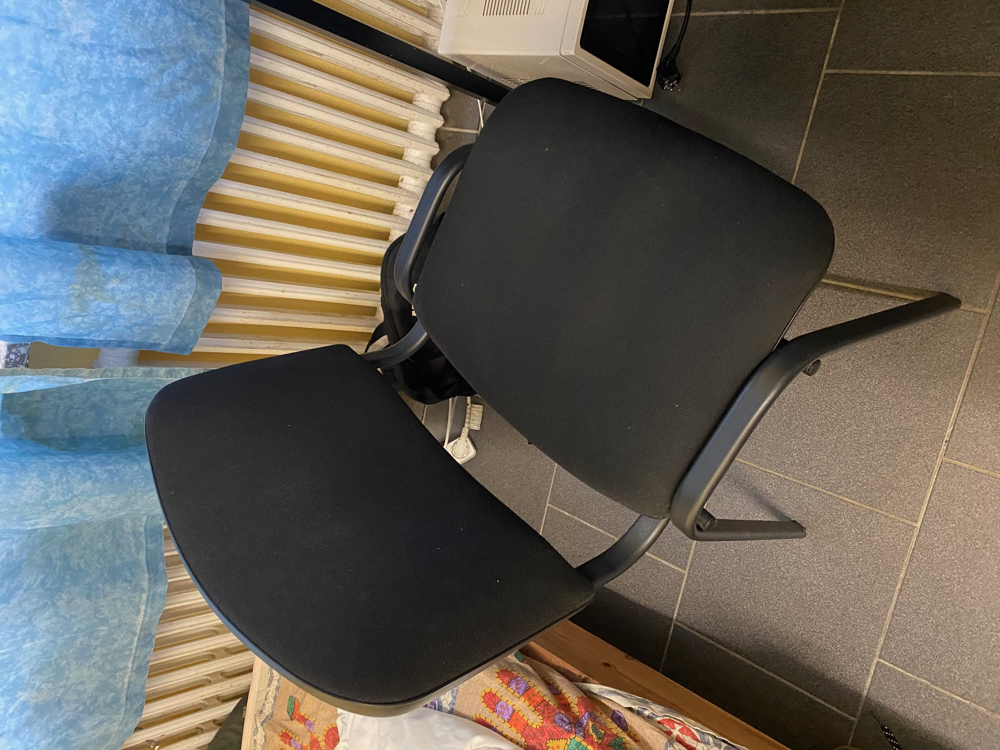

In [4]:
from PIL import Image, ImageEnhance, ImageOps
img = Image.open("mychair.jpg")
img

In [5]:
## Random Augmentation Functions 
import random

def random_augmentation(image, num_augmentations):
    images=list()
    for i in range(num_augmentations):
        # Randomly select an augmentation technique
        augmentation_type = random.choice(['rotate', 'flip_horizontal', 'brightness', 'contrast', 'invert'])

        # Apply the selected augmentation
        augmented_image = apply_augmentation(image, augmentation_type)
        images.append(augmented_image)
    return images

def apply_augmentation(image, augmentation_type):
    if augmentation_type == 'rotate':
        angle = random.uniform(-45, 45)
        return image.rotate(angle)
    
    elif augmentation_type == 'flip_horizontal':
        return ImageOps.mirror(image)
    
    elif augmentation_type == 'brightness':
        factor = random.uniform(0.5, 1.5)
        enhancer = ImageEnhance.Brightness(image)
        return enhancer.enhance(factor)
    
    elif augmentation_type == 'contrast':
        factor = random.uniform(0.5, 1.5)
        enhancer = ImageEnhance.Contrast(image)
        return enhancer.enhance(factor)
    
    elif augmentation_type == 'invert':
        return ImageOps.invert(image)

In [6]:
# Creating test and training sets
wine=Image.open("Wine.jpg")

# Training data
X_train_chair=random_augmentation(img,70)
X_train_wine=random_augmentation(wine,70)

# Test data
X_test_chair=random_augmentation(img,30)
X_test_wine=random_augmentation(wine,30)

In [7]:
y_chair_train=[1]*70
y_wine_train=[0]*70

y_chair_test=[1]*30
y_wine_test=[0]*30

### Create Custom Dataset

In [8]:
from torch.utils.data import Dataset

class CustomImageDataset(Dataset):
    def __init__(self, images,targets,transform):
        self.images=images
        self.transform = transform
        self.targets=targets
        

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        if self.transform:
            image = self.transform(self.images[idx])
        label=self.targets[idx]
        return image, label

In [9]:
X_train=X_train_chair.extend(X_train_wine)
y_train=y_chair_train.extend(y_wine_train)

X_test=X_test_chair.extend(X_test_wine)
y_test=y_chair_test.extend(y_wine_test)

In [10]:
training_data=CustomImageDataset(images=X_train_chair,targets=y_chair_train,transform=transform)
test_data=CustomImageDataset(images=X_test_chair,targets=y_chair_test,transform=transform)

train_dataloader = DataLoader(training_data, batch_size=5, shuffle=True)
test_dataloader = DataLoader(test_data, batch_size=5, shuffle=True)

## Moving on to model Prep

In [13]:
# Freeze early layers
for param in alexnet.parameters():
    param.requires_grad = False


In [36]:
alexnet

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [11]:
## Change Linear Layer
alexnet.classifier[6]=nn.Sequential(
    nn.Linear(4096,4096),
    nn.ReLU(inplace=True),
    nn.Dropout(0.4),
    nn.Linear(4096,1000),
    nn.ReLU(inplace=True),
    nn.Linear(1000,1),
    nn.Sigmoid()
)

### Training

In [30]:
import torch.optim as optim

loss_fn=nn.BCELoss()
optimizer=optim.Adam(alexnet.parameters(),lr=0.0001)

def train_one_epoch(model,dataloader, loss_fn, optimiser):
    total_correct_train=0
    total_samples_train=0
    for inputs, targets in dataloader:

        # Calculate loss
        preds= model(inputs)
        preds=preds.squeeze(-1)
        arr=(preds > 0.5).float()
        targets=targets.to(torch.float32)
        correct = (arr == targets).sum().item()
        total_correct_train += correct
        total_samples_train += 5
        loss=loss_fn(preds,targets)

        # Backpropagation and update weights
        optimiser.zero_grad()
        loss.backward()
        optimiser.step()
    train_accuracy = total_correct_train / total_samples_train
    return loss.item(),train_accuracy


def train(model,train_dl,test_dl, loss_fn, optimiser, epochs):
    for epoch in range(epochs):
        print(f"For EPOCH {epoch}:")
        # Set to training mode
        model.train()
        train_loss,acc_train=train_one_epoch(model,train_dl, loss_fn, optimiser)

        # Set to eval mode
        model.eval()

        # Disable gradient computation and reduce memory consumption.
        with torch.no_grad():
            running_vloss=0
            total_correct_test=0
            total_samples_test=0
            for i,vdata in enumerate(test_dl): 
                vinputs, vlabels = vdata
                voutputs = model(vinputs)
                voutputs=voutputs.squeeze(-1)
                vlabels=vlabels.to(torch.float32)
                arr=(voutputs > 0.5).float()
                correct = (arr == vlabels).sum().item()
                total_correct_test += correct
                total_samples_test += 5
                vloss = loss_fn(voutputs, vlabels)
                running_vloss += vloss
            test_accuracy = total_correct_test / total_samples_test
            avg_vloss = running_vloss / (i + 1)

            print(f"Training LOSS:{train_loss} ACC: {acc_train} || Validation LOSS:{avg_vloss} ACC: {test_accuracy}")
    
                

In [31]:
train(alexnet,train_dataloader,test_dataloader, loss_fn, optimizer, 20)

For EPOCH 0:
Training LOSS:1.4414364295107956e-31 ACC: 1.0 || Validation LOSS:5.202461017920786e-27 ACC: 1.0
For EPOCH 1:
Training LOSS:8.039431245419807e-26 ACC: 1.0 || Validation LOSS:7.169881271099956e-27 ACC: 1.0
For EPOCH 2:
Training LOSS:3.0357106627273694e-29 ACC: 1.0 || Validation LOSS:7.297709093368826e-27 ACC: 1.0
For EPOCH 3:
Training LOSS:5.227057564264737e-31 ACC: 1.0 || Validation LOSS:7.30276889651872e-27 ACC: 1.0
For EPOCH 4:
Training LOSS:1.3428272573587863e-33 ACC: 1.0 || Validation LOSS:7.30278969656212e-27 ACC: 1.0
For EPOCH 5:
Training LOSS:1.3698479160640795e-29 ACC: 1.0 || Validation LOSS:7.302769666890698e-27 ACC: 1.0
For EPOCH 6:
Training LOSS:1.5012890773351598e-23 ACC: 1.0 || Validation LOSS:7.302776600238498e-27 ACC: 1.0
For EPOCH 7:
Training LOSS:9.566764846572536e-23 ACC: 1.0 || Validation LOSS:7.302781992842342e-27 ACC: 1.0
For EPOCH 8:
Training LOSS:3.555221414472248e-22 ACC: 1.0 || Validation LOSS:7.302781992842342e-27 ACC: 1.0
For EPOCH 9:
Training LOS

In [37]:
test_chair=Image.open("chair2.jpg")
test_wine=Image.open("burg-bottle.jpg")
test_chair=transform(test_chair)
test_wine=transform(test_wine)

alexnet.eval()
batch_t = torch.unsqueeze(test_chair, 0)
alexnet(batch_t)

tensor([[0.9999]], grad_fn=<SigmoidBackward0>)

In [41]:
batch_t = torch.unsqueeze(test_wine, 0)
alexnet(batch_t).item()

False